## Import

In [1]:
import pandas as pd
import numpy as np

import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go

import networkx as nx
import json

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer, make_column_transformer

from sklearn.decomposition import PCA, TruncatedSVD
from tslearn.clustering import TimeSeriesKMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.cluster import KMeans, DBSCAN

from tqdm import tqdm

from sklearn import svm
from sklearn.svm import SVC
from sklearn.metrics import mean_absolute_percentage_error

1. Seperate weekdays and weekends. (what about holidays?)
2. Construct the graph according to the MRT map
3. Predict each station's weekdays and weekends traffic by hour.
    - Model choices: GNN
4. Evaluate

## Data Loading & Cleaning

### Lines data

In [2]:
json_paths = ['tpe_mrt_lines.json', 'newtpe_mrt_lines.json']
line_data = []
for path in json_paths:
     with open(path, 'r') as j:
          line_info = json.loads(j.read())
     line_data += line_info

for line in line_data:
    for station in line["Stations"]:
        station["StationName"]["En"] = station["StationName"]["En"].replace(' ', '_')

In [3]:
# Check the line data
for line in line_data:
    print(line['LineID'])

for line in line_data:
    for station in line["Stations"]:
        print(station["StationName"]["En"])

BL
BR
G
O
R
Y
Dingpu
Yongning
Tucheng
Haishan
Far_Eastern_Hospital
Fuzhong
Banqiao
Xinpu
Jiangzicui
Longshan_Temple
Ximen
Taipei_Main_Station
Shandao_Temple
Zhongxiao_Xinsheng
Zhongxiao_Fuxing
Zhongxiao_Dunhua
Sun_Yat-Sen_Memorial_Hall
Taipei_City_Hall
Yongchun
Houshanpi
Kunyang
Nangang
Taipei_Nangang_Exhibition_Center
Taipei_Zoo
Muzha
Wanfang_Community
Wanfang_Hospital
Xinhai
Linguang
Liuzhangli
Technology_Building
Daan
Zhongxiao_Fuxing
Nanjing_Fuxing
Zhongshan_Junior_High_School
Songshan_Airport
Dazhi
Jiannan_Rd.
Xihu
Gangqian
Wende
Neihu
Dahu_Park
Huzhou
Donghu
Nangang_Software_Park
Taipei_Nangang_Exhibition_Center
Xindian
Xindian_District_Office
Qizhang
Dapinglin
Jingmei
Wanlong
Gongguan
Taipower_Building
Guting
Chiang_Kai-Shek_Memorial_Hall
Xiaonanmen
Ximen
Beimen
Zhongshan
Songjiang_Nanjing
Nanjing_Fuxing
Taipei_Arena
Nanjing_Sanmin
Songshan
Xiaobitan
Nanshijiao
Jingan
Yongan_Market
Dingxi
Guting
Dongmen
Zhongxiao_Xinsheng
Songjiang_Nanjing
Xingtian_Temple
Zhongshan_Elementary_Sc

### Stations traffic data

In [4]:
# urls_df = pd.read_csv('tpe_mrt_traffic.csv')

# for index, row in tqdm(urls_df.iterrows()):
#     month = row["年月"]
#     file_url = row['URL']
#     print(f"Loading: {month}")
    
#     df = pd.concat([chunk for chunk in tqdm(pd.read_csv(file_url, chunksize=1000), desc='Loading data')])
#     df.to_parquet(f'monthly_data/{month}.parquet.gzip', compression='gzip')

In [9]:
df = pd.read_parquet('monthly_data/202306.parquet.gzip')

In [10]:
# df = df.reset_index()
df = df.rename(columns={"時段": "hour", "日期": "date", "進站":"origin", "出站":"destination", "人次":"passenger_cnt"})
df

,date,hour,origin,destination,passenger_cnt
0,2023-06-01,0,松山機場,松山機場,0
1,2023-06-01,0,松山機場,中山國中,0
2,2023-06-01,0,松山機場,南京復興,0
3,2023-06-01,0,松山機場,忠孝復興,0
4,2023-06-01,0,松山機場,大安,1
...,...,...,...,...,...
8096755,2023-06-30,23,新北產業園區,徐匯中學,0
8096756,2023-06-30,23,新北產業園區,三和國中,0
8096757,2023-06-30,23,新北產業園區,三重國小,0
8096758,2023-06-30,23,新北產業園區,迴龍,0


### Mapping English station names

In [11]:
# Mapping Chinese names to English names using the JSON data
chinese_to_english = {}
for line in line_data:
    for station in line["Stations"]:
        chinese_to_english[station["StationName"]["Zh_tw"]] = station["StationName"]["En"]

# Replace Chinese station names with English names
df["origin"] = df["origin"].map(chinese_to_english)
df["destination"] = df["destination"].map(chinese_to_english)

df = df.dropna()
df

,date,hour,origin,destination,passenger_cnt
0,2023-06-01,0,Songshan_Airport,Songshan_Airport,0
1,2023-06-01,0,Songshan_Airport,Zhongshan_Junior_High_School,0
2,2023-06-01,0,Songshan_Airport,Nanjing_Fuxing,0
3,2023-06-01,0,Songshan_Airport,Zhongxiao_Fuxing,0
4,2023-06-01,0,Songshan_Airport,Daan,1
...,...,...,...,...,...
8096755,2023-06-30,23,New_Taipei_Industrial_Park,St.lgnatius_High_School,0
8096756,2023-06-30,23,New_Taipei_Industrial_Park,Sanhe_Junior_High_School,0
8096757,2023-06-30,23,New_Taipei_Industrial_Park,Sanchong_Elementary_School,0
8096758,2023-06-30,23,New_Taipei_Industrial_Park,Huilong,0


In [12]:
df['datetime'] = pd.to_datetime(df['date']) + df['hour'].astype('timedelta64[h]')
df['dayOfWeek'] = df['datetime'].dt.day_name()
df['weekday'] = df['dayOfWeek'].apply(lambda x: 0 if x in ['Saturday', 'Sunday'] else 1)
df

/var/folders/x5/4d64q7td2l59kf73lvykgkq40000gn/T/ipykernel_94594/2225038877.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['datetime'] = pd.to_datetime(df['date']) + df['hour'].astype('timedelta64[h]')
/var/folders/x5/4d64q7td2l59kf73lvykgkq40000gn/T/ipykernel_94594/2225038877.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['dayOfWeek'] = df['datetime'].dt.day_name()
/var/folders/x5/4d64q7td2l59kf73lvykgkq40000gn/T/ipykernel_94594/2225038877.py:3: SettingWithCopyWarning: 
A value is trying to

,date,hour,origin,destination,passenger_cnt,datetime,dayOfWeek,weekday
0,2023-06-01,0,Songshan_Airport,Songshan_Airport,0,2023-06-01 00:00:00,Thursday,1
1,2023-06-01,0,Songshan_Airport,Zhongshan_Junior_High_School,0,2023-06-01 00:00:00,Thursday,1
2,2023-06-01,0,Songshan_Airport,Nanjing_Fuxing,0,2023-06-01 00:00:00,Thursday,1
3,2023-06-01,0,Songshan_Airport,Zhongxiao_Fuxing,0,2023-06-01 00:00:00,Thursday,1
4,2023-06-01,0,Songshan_Airport,Daan,1,2023-06-01 00:00:00,Thursday,1
...,...,...,...,...,...,...,...,...
8096755,2023-06-30,23,New_Taipei_Industrial_Park,St.lgnatius_High_School,0,2023-06-30 23:00:00,Friday,1
8096756,2023-06-30,23,New_Taipei_Industrial_Park,Sanhe_Junior_High_School,0,2023-06-30 23:00:00,Friday,1
8096757,2023-06-30,23,New_Taipei_Industrial_Park,Sanchong_Elementary_School,0,2023-06-30 23:00:00,Friday,1
8096758,2023-06-30,23,New_Taipei_Industrial_Park,Huilong,0,2023-06-30 23:00:00,Friday,1


## EDA

In [13]:
day_data = df.groupby(['dayOfWeek', 'hour'])['passenger_cnt'].agg('sum').reset_index()
fig = px.line(day_data, x="hour", y="passenger_cnt", facet_col="dayOfWeek")
fig.show()

In [14]:
weekday_data = df.groupby(['weekday', 'hour'])['passenger_cnt'].agg('mean').reset_index()
fig = px.line(weekday_data, x="hour", y="passenger_cnt", facet_col="weekday")
fig.show()

In [15]:
df_weekday = df[df['weekday'] == 1].groupby(['hour','origin'])['passenger_cnt'].agg('mean').reset_index()

# Comment this line to plot all stations
df_weekday_plot = df_weekday[df_weekday['origin'].isin(['Zhongxiao_Fuxing', 'Taipei_City_Hall', 'Xinpu', 'Yongan_Market'])] 
df_weekday_plot['Area'] = ['Business', 'Residence', 'Residence','Business'] * 21

fig = px.line(df_weekday_plot, x="hour", y="passenger_cnt", 
              color='Area', line_group="origin", 
              title='Average Weekday Input by Stations - Specifying Residence/Business Area',
              labels={
                        "passenger_cnt": "Passengers Count",
                        "hour": "Hour",
                    },)
fig.show()

/var/folders/x5/4d64q7td2l59kf73lvykgkq40000gn/T/ipykernel_94594/4068975086.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Modeling

### Task 1: Routes Clustering - $k$-means and Dynamic Time Warping

In [55]:
df['route_weekday'] = df['origin'] + '|' + df['destination'] + '|' + df['weekday'].astype(int).astype(str)
df['route'] = df['origin'] + '|' + df['destination']
df

/var/folders/x5/4d64q7td2l59kf73lvykgkq40000gn/T/ipykernel_46757/3445171312.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/x5/4d64q7td2l59kf73lvykgkq40000gn/T/ipykernel_46757/3445171312.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,index,date,hour,in,out,passenger_cnt,datetime,dayOfWeek,weekday,route_weekday,route
0,0,2017-06-01,0,Songshan_Airport,Songshan_Airport,1,2017-06-01 00:00:00,Thursday,1,Songshan_Airport|Songshan_Airport|1,Songshan_Airport|Songshan_Airport
1,1,2017-06-01,0,Songshan_Airport,Zhongshan_Junior_High_School,0,2017-06-01 00:00:00,Thursday,1,Songshan_Airport|Zhongshan_Junior_High_School|1,Songshan_Airport|Zhongshan_Junior_High_School
2,2,2017-06-01,0,Songshan_Airport,Nanjing_Fuxing,0,2017-06-01 00:00:00,Thursday,1,Songshan_Airport|Nanjing_Fuxing|1,Songshan_Airport|Nanjing_Fuxing
3,3,2017-06-01,0,Songshan_Airport,Zhongxiao_Fuxing,0,2017-06-01 00:00:00,Thursday,1,Songshan_Airport|Zhongxiao_Fuxing|1,Songshan_Airport|Zhongxiao_Fuxing
4,4,2017-06-01,0,Songshan_Airport,Daan,2,2017-06-01 00:00:00,Thursday,1,Songshan_Airport|Daan|1,Songshan_Airport|Daan
...,...,...,...,...,...,...,...,...,...,...,...
7348315,7348315,2017-06-30,23,Danfeng,St.lgnatius_High_School,1,2017-06-30 23:00:00,Friday,1,Danfeng|St.lgnatius_High_School|1,Danfeng|St.lgnatius_High_School
7348316,7348316,2017-06-30,23,Danfeng,Sanhe_Junior_High_School,0,2017-06-30 23:00:00,Friday,1,Danfeng|Sanhe_Junior_High_School|1,Danfeng|Sanhe_Junior_High_School
7348317,7348317,2017-06-30,23,Danfeng,Sanchong_Elementary_School,0,2017-06-30 23:00:00,Friday,1,Danfeng|Sanchong_Elementary_School|1,Danfeng|Sanchong_Elementary_School
7348318,7348318,2017-06-30,23,Danfeng,Huilong,3,2017-06-30 23:00:00,Friday,1,Danfeng|Huilong|1,Danfeng|Huilong


In [49]:
class KmeansClustering():
    def __init__(self, n_clusters):
        self.n_clusters = n_clusters
        
    def data_preproccess(self, df):
        scaler = StandardScaler()
        df = df.groupby(['hour', 'route_weekday'])['passenger_cnt'].agg('mean').reset_index().reset_index()
        df = df[['hour', 'passenger_cnt', 'route_weekday']].pivot_table(index='route_weekday', columns='hour', values='passenger_cnt')
        return scaler.fit_transform(df)
        
    # def get_transformed_X(self):
    #     return self.transformed_X

    def train(self, df):
        self.df = df
        self.transformed_X = self.km_data_preproccessor(self.df)
        model = TimeSeriesKMeans(n_clusters=self.n_clusters, random_state=42)
        self.pred_label = model.fit_predict(self.transformed_X)
    
    def get_predct_labels(self):
        return self.pred_label
        
    def get_label_data(self):
        pivot_df = self.df[['hour', 'passenger_cnt', 'route_weekday']].pivot_table(index='route_weekday', columns='hour', values='passenger_cnt')
        
        label_dict = {}
        for route_weekday, label in zip(pivot_df.index, self.pred_label):
            label_dict[route_weekday] = label
        
        self.labeled_df = pivot_df.reset_index().melt(id_vars='route_weekday', value_vars=list(pivot_df.columns[1:]), value_name='passenger_cnt')
        self.labeled_df['cluster'] = self.labeled_df['route_weekday'].map(label_dict)
        self.labeled_df['weekday'] = self.labeled_df['route_weekday'].apply(lambda x: x.split('|')[-1])

        return self.labeled_df

    def km_clustering_plot(self):
        self.get_label_data()
        self.group_labeled_df = self.labeled_df.groupby(['weekday', 'hour', 'cluster'])['passenger_cnt'].agg('mean').reset_index()
        
        fig1 = px.line(self.group_labeled_df, x="hour", y="passenger_cnt", facet_col="cluster", title="Clusters Mean")
        fig2  = px.box(self.labeled_df, x="hour", y="passenger_cnt", facet_col="cluster")
        
        for fig in [fig1, fig2]:
            fig.update_yaxes(matches=None)

        return fig1.show(), fig2.show();        

In [34]:
df_weekday = df[df['weekday'] == 1]
df_weekend = df[df['weekday'] == 0]

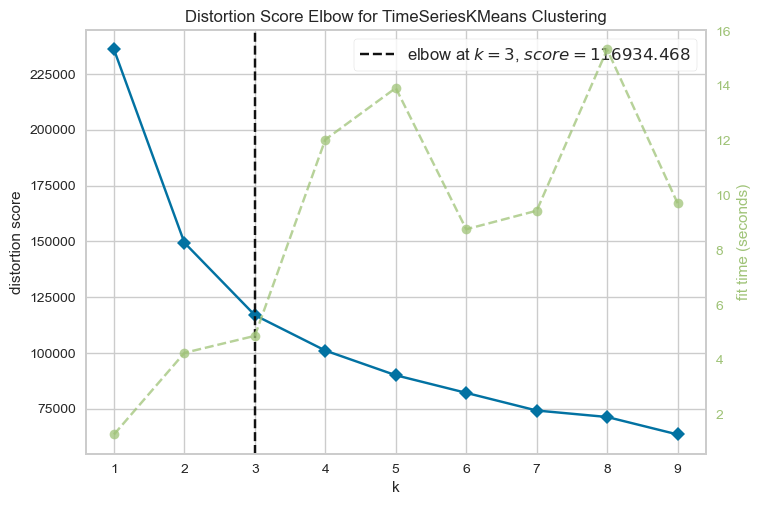

In [50]:
X = KmeansClustering.data_preproccess(1, df_weekday)

model = TimeSeriesKMeans(random_state=42)

visualizer = KElbowVisualizer(model, k=(1, 10))
visualizer.fit(X) 
visualizer.show();

In [42]:
# model = TimeSeriesKMeans(9, random_state=42)

# visualizer = SilhouetteVisualizer(model, colors="yellowbrick")
# visualizer.fit(X)  # Fit the data to the visualizer
# visualizer.show();

In [47]:
km = KmeansClustering(n_clusters=4)
km.train(df_weekday)

km.km_clustering_plot()

(None, None)

### Task 2: Station Clustering
- PCA to extract principal components, which refect the important time periods, such as morning and evening.

In [14]:
# class PCAClustering():
#     def

def data_preproccess(df):
    scaler = StandardScaler()
    df[['origin', 'destination', 'dayOfWeek', 'hour', 'passenger_cnt']].melt(value_vars=['in', 'out'], id_vars=['passenger_cnt', 'dayOfWeek', 'hour'])
    # df.groupby(['dayOfWeek', 'hour', 'pass_type', 'station'])['passenger_cnt'].agg('sum').reset_index()
    return scaler.fit_transform(df)


In [15]:
df_weekday = df[df['weekday'] == 1]

In [19]:
# df_weekday[['in', 'out']].melt(var_name='passenger_type', value_name='station')
df_weekday = df_weekday[['origin', 'destination', 'dayOfWeek', 'hour', 'passenger_cnt']].melt(id_vars=['passenger_cnt', 'dayOfWeek', 'hour'], value_vars=['origin', 'destination'], var_name ='pass_type', value_name='station')
# df_weekday = df_weekday.groupby(['dayOfWeek', 'hour', 'pass_type', 'station'])['passenger_cnt'].agg('sum').reset_index()
df_weekday

,passenger_cnt,dayOfWeek,hour,pass_type,station
0,1,Thursday,0,origin,Songshan_Airport
1,0,Thursday,0,origin,Songshan_Airport
2,0,Thursday,0,origin,Songshan_Airport
3,0,Thursday,0,origin,Songshan_Airport
4,2,Thursday,0,origin,Songshan_Airport
...,...,...,...,...,...
10382059,1,Friday,23,destination,St.lgnatius_High_School
10382060,0,Friday,23,destination,Sanhe_Junior_High_School
10382061,0,Friday,23,destination,Sanchong_Elementary_School
10382062,3,Friday,23,destination,Huilong


In [20]:
df_weekday

,passenger_cnt,dayOfWeek,hour,pass_type,station
0,1,Thursday,0,origin,Songshan_Airport
1,0,Thursday,0,origin,Songshan_Airport
2,0,Thursday,0,origin,Songshan_Airport
3,0,Thursday,0,origin,Songshan_Airport
4,2,Thursday,0,origin,Songshan_Airport
...,...,...,...,...,...
10382059,1,Friday,23,destination,St.lgnatius_High_School
10382060,0,Friday,23,destination,Sanhe_Junior_High_School
10382061,0,Friday,23,destination,Sanchong_Elementary_School
10382062,3,Friday,23,destination,Huilong


In [471]:
ct = ColumnTransformer(
     [
     #     ("drop", 'drop', ["station"]),
          ("categorical", OneHotEncoder(drop="if_binary"), ["hour"]), # ("categorical", OneHotEncoder(drop="if_binary"), ["dayOfWeek", "pass_type", "station"])
          # ("ordinal", OrdinalEncoder(), ["hour"]),
          # ( "numeric", StandardScaler(), ["passenger_cnt"])
     ])

X_transformed = ct.fit_transform(df_weekday)
X_transformed

<6216672x21 sparse matrix of type '<class 'numpy.float64'>'
	with 6216672 stored elements in Compressed Sparse Row format>

In [468]:
col_name = ct.get_feature_names_out()

In [469]:
n_components = 3
svd = TruncatedSVD(n_components=n_components)
svd.fit(X_transformed)

TruncatedSVD(n_components=3)

In [470]:
Z = svd.transform(X_transformed)  # transform the data
component_labels = ["PC" + str(i + 1) for i in range(n_components)]
# pd.DataFrame(Z, columns=component_labels, index=X_pizza.index)

W = svd.components_
pd.DataFrame(W, columns=col_name, index=component_labels).style.background_gradient(cmap='RdYlGn')

,categorical__hour_0,categorical__hour_1,categorical__hour_5,categorical__hour_6,categorical__hour_7,categorical__hour_8,categorical__hour_9,categorical__hour_10,categorical__hour_11,categorical__hour_12,categorical__hour_13,categorical__hour_14,categorical__hour_15,categorical__hour_16,categorical__hour_17,categorical__hour_18,categorical__hour_19,categorical__hour_20,categorical__hour_21,categorical__hour_22,categorical__hour_23
PC1,-0.060502,0.263362,0.524991,0.161612,-0.172806,-0.071680,0.324160,-0.306141,-0.117984,-0.086912,-0.153654,-0.057863,-0.200271,-0.306580,0.348061,0.025628,0.245657,0.093973,-0.066766,0.108916,-0.040150
PC2,0.044288,-0.389553,0.159280,0.060590,-0.092226,0.142484,0.145895,0.386738,0.014618,0.110446,0.160901,-0.407599,-0.141178,0.170715,0.425909,0.241631,-0.056577,-0.274694,-0.123513,-0.020710,0.173053
PC3,-0.120472,0.016622,0.306887,-0.048179,-0.110958,-0.287961,-0.090206,-0.016131,-0.126282,0.586330,0.057646,0.067923,-0.179161,0.330976,-0.223423,-0.072204,0.273802,-0.063192,0.108285,-0.358567,0.037167


#### 2.1

In [34]:
df_weekday = df[df['weekday'] == 1]
df_weekday = df_weekday[['in', 'out', 'dayOfWeek', 'hour', 'passenger_cnt']].melt(id_vars=['passenger_cnt', 'dayOfWeek', 'hour'], value_vars=['in', 'out'], var_name ='pass_type', value_name='station')
data = df_weekday.pivot_table(index='station', columns=['hour', 'pass_type'], values='passenger_cnt')
data.columns = [pass_type + '_' + str(hour) for hour in data.columns.get_level_values(0).unique() for pass_type in ['in', 'out']]

In [54]:
n_components = 2
pca = PCA(n_components=n_components)
pca.fit(data)

PCA(n_components=2)

In [55]:
Z = pca.transform(data)  # transform the data
component_labels = ["PC" + str(i + 1) for i in range(n_components)]
# pd.DataFrame(Z, columns=component_labels, index=X_pizza.index)

W = pca.components_
pd.DataFrame(W, columns=data.columns, index=component_labels)

,in_0,out_0,in_1,out_1,in_5,out_5,in_6,out_6,in_7,out_7,...,in_19,out_19,in_20,out_20,in_21,out_21,in_22,out_22,in_23,out_23
PC1,0.025892,0.006889,0.000540,-0.000024,0.000014,0.000019,0.020698,0.049339,0.078898,0.146589,...,0.249217,0.182811,0.178611,0.116166,0.189123,0.10721,0.199882,0.076191,0.071993,0.025408
PC2,0.003359,-0.019914,0.000172,-0.000750,-0.000016,-0.000015,-0.059939,-0.004620,-0.248537,0.107620,...,0.182411,-0.217809,0.077777,-0.161796,0.073706,-0.16877,0.051233,-0.160840,0.012697,-0.059839


In [89]:
pd.DataFrame(W, columns=data.columns, index=component_labels).iloc[0,:].sort_values(ascending = False)[:5]

in_18     0.324519
out_8     0.311028
out_18    0.295864
in_19     0.249217
out_17    0.241180
Name: PC1, dtype: float64

In [91]:
Xt = pca.fit_transform(data)
Xt = pd.DataFrame(Xt)
Xt.columns = ['in_morning', 'out_evening']
Xt['station'] = data.index
fig = px.scatter(Xt, Xt['in_morning'], Xt['out_evening'], color='station')
fig.show()

### Task 3: SVM

#### Data Preparation

In [11]:
df_weekday = df[df['weekday'] == 1]
df_weekday = df_weekday[['in', 'out', 'dayOfWeek', 'hour', 'passenger_cnt']].melt(id_vars=['passenger_cnt', 'dayOfWeek', 'hour'], value_vars=['in', 'out'], var_name ='pass_type', value_name='station')
df_weekday

,passenger_cnt,dayOfWeek,hour,pass_type,station
0,1,Thursday,0,in,Songshan_Airport
1,0,Thursday,0,in,Songshan_Airport
2,0,Thursday,0,in,Songshan_Airport
3,0,Thursday,0,in,Songshan_Airport
4,2,Thursday,0,in,Songshan_Airport
...,...,...,...,...,...
10382059,1,Friday,23,out,St.lgnatius_High_School
10382060,0,Friday,23,out,Sanhe_Junior_High_School
10382061,0,Friday,23,out,Sanchong_Elementary_School
10382062,3,Friday,23,out,Huilong


In [12]:
ct = ColumnTransformer(
     [
          # ("drop", 'drop', ["station"]),
          ("categorical", OneHotEncoder(drop="if_binary"), ["dayOfWeek", "pass_type", "hour", "station"]), # ("categorical", OneHotEncoder(drop="if_binary"), ["dayOfWeek", "pass_type", "station"])
          # ("ordinal", OrdinalEncoder(), ["hour"]),
          # ( "numeric", StandardScaler(), ["passenger_cnt"])
     ])

In [13]:
train_df, test_df = train_test_split(df_weekday, test_size=0.2, random_state=42)

X_train_transformed = ct.fit_transform(train_df)
X_train_transformed

<8305651x133 sparse matrix of type '<class 'numpy.float64'>'
	with 29070079 stored elements in Compressed Sparse Row format>

In [14]:
y_train = train_df['passenger_cnt'].values

model_SVR = svm.SVR()
model_SVR.fit(X_train_transformed, y_train)
Y_pred = model_SVR.predict(X_test)

In [ ]:
test_df['pred'] = Y_pred
test_df['residual'] = test_df['passenger_cnt'] - test_df['pred']

# test_group = test_df[['weekday', 'hour','passenger_cnt', 'pred']].groupby(['weekday', 'hour']).agg('mean').reset_index()

# fig = px.line(test_group, x = 'hour', y = ['passenger_cnt', 'pred'])
# fig.show()

fig = px.line(test_df, x = 'passenger_cnt', y = 'residual')
fig.show()

### Task 4: GNN

In [16]:
# Map node labels to integer indices
node_to_index = {node: index for index, node in enumerate(G.nodes())}

# Convert edge tuples with string node labels to edge tuples with integer indices
edges = [(node_to_index[edge[0]], node_to_index[edge[1]]) for edge in G.edges()]

# Define edge_index as a 2D tensor
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

In [17]:
# Step 1: Prepare the data
# Encode categorical features (starting_station and ending_station)
df["in"] = df["in"].map(node_to_index)
df["out"] = df["out"].map(node_to_index)

/var/folders/x5/4d64q7td2l59kf73lvykgkq40000gn/T/ipykernel_48154/1951646176.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["in"] = df["in"].map(node_to_index)
/var/folders/x5/4d64q7td2l59kf73lvykgkq40000gn/T/ipykernel_48154/1951646176.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["out"] = df["out"].map(node_to_index)


In [23]:
X_train_transformed = torch.tensor(X_train_transformed, dtype=torch.float)
y_train = torch.tensor(train_df['passenger_cnt'].values, dtype=torch.float)
X_test_transformed = torch.tensor(X_test_transformed, dtype=torch.float)
y_train = torch.tensor(test_df['passenger_cnt'].values, dtype=torch.float)

TypeError: sparse array length is ambiguous; use getnnz() or shape[0]

In [166]:
# Step 3: Define the GNN model architecture
class GNN(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(GNN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, 1)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = torch.relu(x)
        x = self.conv2(x, edge_index)
        x = 
        return x
    
class GCN(nn.Module):
    def __init__(self, *sizes):
        super().__init__()
        self.layers = nn.ModuleList([
            nn.Linear(x, y) for x, y in zip(sizes[:-1], sizes[1:])
        ])
    def forward(self, vertices, edges):
        # ----- Build the adjacency matrix -----
        # Start with self-connections
        adj = torch.eye(len(vertices))
        # edges contain connected vertices: [vertex_0, vertex_1] 
        adj[edges[:, 0], edges[:, 1]] = 1
        adj[edges[:, 1], edges[:, 0]] = 1

        # ----- Forward data pass -----
        for layer in self.layers:
            vertices = torch.sigmoid(layer(adj @ vertices))

        return vertices

# Step 4: Train the GNN model using the given data
# Define the model, optimizer, and loss function
    
model = GNN(input_dim=len(features), hidden_dim=16)
optimizer = optim.Adam(model.parameters(), lr=0.01)
criterion = nn.MSELoss()

# Train the model
model.train()
for epoch in range(100):
    optimizer.zero_grad()
    outputs = model(X_train_transformed, edge_index)
    loss = criterion(outputs.view(-1), y_train)
    loss.backward()
    optimizer.step()
    print(f"Epoch {epoch+1}, Loss: {loss.item()}")

/Users/oybb/miniconda3/envs/tpe_mrt/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning:

Using a target size (torch.Size([1415736])) that is different to the input size (torch.Size([5662944])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



RuntimeError: The size of tensor a (5662944) must match the size of tensor b (1415736) at non-singleton dimension 0

In [140]:
model.eval()

with torch.no_grad():
    predicted_output = model(X_test_transformed, edge_index)

In [141]:
reverse_node_index = {v:k for k,v in node_to_index.items()}

test_df['pred'] = predicted_output
# test_df['error'] = test_df['passenger_cnt'] - test_df['pred']

test_df["in"].map(reverse_node_index)
test_df["out"].map(reverse_node_index)

968960                   Touqianzhuang
105074     Zhongshan_Elementary_School
5978201                       Yongchun
3323023                        Kunyang
1671582                        Fuzhong
                      ...             
6607477                  Yongan_Market
1998061                         Dingpu
7127878                       Sanchong
2666764                      Dapinglin
1698960                     Taipei_Zoo
Name: out, Length: 1415736, dtype: object

In [142]:
test_group = test_df[['weekday', 'hour','passenger_cnt', 'pred']].groupby(['weekday', 'hour']).agg('mean').reset_index()

fig = px.line(test_group, x = 'hour', y = ['passenger_cnt', 'pred'], facet_col='weekday')
fig.show()

### Task 5: PCA & K-Means

#### Data Wrangling - Build graph

![Drag Racing](2023_Taipei_MRT_official_map.png)

In [106]:
G = nx.Graph()
station_geo = pd.read_csv('northern-taiwan.csv') 
# Add nodes for each station
for line in line_data:
    for station in line["Stations"]:
        latitude = station_geo[station_geo['station_code'] == station['StationID']]['lat'].iloc[0]
        longitude = station_geo[station_geo['station_code'] == station['StationID']]['lon'].iloc[0]
        G.add_node(station["StationName"]["En"],  pos=[longitude, latitude])

# Add edges based on Sequence within the same LineID
for line in line_data:
    prev_station = None
    for station in line["Stations"]:
        if prev_station is not None:
            G.add_edge(prev_station["StationName"]["En"], station["StationName"]["En"])
        prev_station = station

In [107]:
node_name = 'Jingan'
neighbors = list(G.neighbors(node_name))
print("Neighbors of", node_name, ":", neighbors)

Neighbors of Jingan : ['Nanshijiao', 'Yongan_Market', 'Jingping', 'Zhonghe']


#### Filter weekdays data

In [11]:
df_weekday = df[df['weekday'] == 1]
df_weekday

,date,hour,origin,destination,passenger_cnt,datetime,dayOfWeek,weekday
0,2022-06-01,0,Songshan_Airport,Songshan_Airport,0,2022-06-01 00:00:00,Wednesday,1
1,2022-06-01,0,Songshan_Airport,Zhongshan_Junior_High_School,0,2022-06-01 00:00:00,Wednesday,1
2,2022-06-01,0,Songshan_Airport,Nanjing_Fuxing,0,2022-06-01 00:00:00,Wednesday,1
3,2022-06-01,0,Songshan_Airport,Zhongxiao_Fuxing,0,2022-06-01 00:00:00,Wednesday,1
4,2022-06-01,0,Songshan_Airport,Daan,0,2022-06-01 00:00:00,Wednesday,1
...,...,...,...,...,...,...,...,...
8921424,2022-06-30,23,New_Taipei_Industrial_Park,Zhongyuan,2,2022-06-30 23:00:00,Thursday,1
8921425,2022-06-30,23,New_Taipei_Industrial_Park,Banxin,1,2022-06-30 23:00:00,Thursday,1
8921427,2022-06-30,23,New_Taipei_Industrial_Park,Xinpu_Minsheng,4,2022-06-30 23:00:00,Thursday,1
8921428,2022-06-30,23,New_Taipei_Industrial_Park,Xingfu,8,2022-06-30 23:00:00,Thursday,1


In [16]:
def create_Y_for_origin_to_dest(
    data, hour, N, M, origin_mapper, dest_mapper, origin_key="origin", dest_key="destination"
):  # Function to create a dense utility matrix
    data = data[data['hour'] == hour].groupby(['origin', 'destination'])['passenger_cnt'].mean().reset_index()
    Y = np.zeros((N, M))
    Y.fill(np.nan)
    for index, val in data.iterrows():
        n = origin_mapper[val[origin_key]]
        m = dest_mapper[val[dest_key]]
        Y[n, m] = val["passenger_cnt"]

    return Y

def create_Y_for_origin_hour(
    data, N, M, origin_mapper, hour_mapper, origin_key="origin", hour_key="hour"
):  # Function to create a dense utility matrix
    data = data.groupby(['origin', 'hour'])['passenger_cnt'].mean().reset_index()
    Y = np.zeros((N, M))
    Y.fill(np.nan)
    for index, val in data.iterrows():
        n = origin_mapper[val[origin_key]]
        m = hour_mapper[val[hour_key]]
        Y[n, m] = val["passenger_cnt"]

    return Y

In [13]:
# origin_to_dest
N = len(df_weekday['origin'].unique())
M = len(df_weekday['destination'].unique())
origin_mapper = dict(zip(np.unique(df_weekday['origin']), list(range(N))))
dest_mapper = dict(zip(np.unique(df_weekday['destination']), list(range(M))))
origin_inverse_mapper = dict(zip(list(range(N)), np.unique(df_weekday['origin'])))
dest_inverse_mapper = dict(zip(list(range(M)), np.unique(df_weekday['destination'])))

utility_mats = {hour: create_Y_for_origin_to_dest(df_weekday, hour,  N, M, origin_mapper, dest_mapper) 
                for hour in df_weekday['hour'].unique()}

In [20]:
# origin v.s. hour

N = len(df_weekday['origin'].unique())
M = len(df_weekday['hour'].unique())
origin_mapper = dict(zip(np.unique(df_weekday['origin']), list(range(N))))
hour_mapper = dict(zip(np.unique(df_weekday['hour']), list(range(M))))
origin_inverse_mapper = dict(zip(list(range(N)), np.unique(df_weekday['origin'])))
dest_inverse_mapper = dict(zip(list(range(M)), np.unique(df_weekday['hour'])))

utility_mat = create_Y_for_origin_hour(df_weekday,  N, M, origin_mapper, hour_mapper)
utility_mat = utility_mat / utility_mat.sum(axis=1)[:,None]

pd.DataFrame(utility_mat.round(2), index=origin_mapper.keys(), columns=hour_mapper.keys())

,0,1,5,6,7,8,9,10,11,12,...,14,15,16,17,18,19,20,21,22,23
Banxin,0.00,0.0,0.0,0.02,0.09,0.15,0.09,0.04,0.04,0.04,...,0.03,0.04,0.05,0.07,0.12,0.07,0.04,0.03,0.03,0.01
Beimen,0.01,0.0,0.0,0.01,0.05,0.11,0.05,0.03,0.04,0.04,...,0.05,0.05,0.06,0.10,0.14,0.09,0.05,0.04,0.03,0.01
Beitou,0.00,0.0,0.0,0.03,0.10,0.15,0.08,0.06,0.05,0.05,...,0.05,0.04,0.05,0.07,0.08,0.04,0.03,0.03,0.02,0.01
Cailiao,0.00,0.0,0.0,0.03,0.13,0.23,0.11,0.05,0.04,0.04,...,0.03,0.03,0.04,0.06,0.06,0.03,0.02,0.02,0.02,0.01
Chiang_Kai-Shek_Memorial_Hall,0.00,0.0,0.0,0.01,0.03,0.06,0.04,0.03,0.04,0.06,...,0.05,0.05,0.08,0.15,0.15,0.07,0.04,0.05,0.04,0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zhongxiao_Fuxing,0.01,0.0,0.0,0.00,0.02,0.03,0.02,0.02,0.03,0.04,...,0.05,0.06,0.07,0.09,0.12,0.10,0.09,0.09,0.07,0.03
Zhongxiao_Xinsheng,0.01,0.0,0.0,0.01,0.02,0.05,0.03,0.03,0.03,0.04,...,0.05,0.05,0.07,0.11,0.16,0.10,0.07,0.07,0.05,0.02
Zhongyi,0.00,0.0,0.0,0.02,0.07,0.09,0.05,0.04,0.05,0.05,...,0.04,0.04,0.06,0.10,0.14,0.10,0.05,0.02,0.01,0.01
Zhongyuan,0.00,0.0,0.0,0.01,0.04,0.08,0.04,0.03,0.02,0.03,...,0.02,0.02,0.03,0.08,0.28,0.17,0.05,0.03,0.02,0.01


In [15]:
# Get the propotion of departure passenger count by oringin station (row) 
for hour in utility_mats:
    utility_mats[hour] = utility_mats[hour] / utility_mats[hour].sum(axis=1)[:,None]

utility_mats[8].sum(axis=1) # Sum by row should be 1s

/var/folders/x5/4d64q7td2l59kf73lvykgkq40000gn/T/ipykernel_43278/2922910604.py:3: RuntimeWarning: invalid value encountered in divide
  utility_mats[hour] = utility_mats[hour] / utility_mats[hour].sum(axis=1)[:,None]


array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [16]:
pd.DataFrame(utility_mats[8])

,0,1,2,3,4,5,6,7,8,9,...,106,107,108,109,110,111,112,113,114,115
0,0.001504,0.000579,0.000000,0.008332,0.001967,0.009605,0.000000,0.000000,0.011226,0.191992,...,0.031362,0.000926,0.001620,0.000116,0.002199,0.003819,0.000347,0.000000,0.073255,0.000116
1,0.000252,0.002317,0.000957,0.000101,0.036272,0.008514,0.001965,0.000101,0.000000,0.022569,...,0.000000,0.023375,0.001763,0.007809,0.005038,0.006549,0.004937,0.002418,0.000202,0.001360
2,0.000000,0.010084,0.003369,0.003773,0.019651,0.018147,0.004851,0.000067,0.001729,0.009163,...,0.000112,0.030207,0.007097,0.001819,0.008669,0.007614,0.008826,0.006558,0.002223,0.007546
3,0.002300,0.002243,0.002271,0.001760,0.010789,0.016354,0.004855,0.000028,0.008603,0.013969,...,0.002868,0.011755,0.031261,0.002413,0.015190,0.010733,0.025327,0.005054,0.008972,0.001022
4,0.000130,0.010602,0.006431,0.000652,0.015382,0.027809,0.003085,0.000348,0.000348,0.016642,...,0.000739,0.019510,0.002911,0.004910,0.005431,0.004693,0.010385,0.005866,0.000912,0.002086
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111,0.000048,0.005174,0.002874,0.001916,0.013318,0.019115,0.000479,0.000814,0.001341,0.006707,...,0.000144,0.009294,0.010444,0.023522,0.009198,0.005653,0.013318,0.002587,0.001102,0.000335
112,0.000336,0.006801,0.001931,0.006465,0.015029,0.008816,0.000882,0.000504,0.003232,0.012300,...,0.000924,0.012846,0.021032,0.003736,0.018051,0.014399,0.009194,0.000756,0.003946,0.001847
113,0.000633,0.001267,0.032088,0.004855,0.017944,0.018366,0.008022,0.000422,0.005066,0.012666,...,0.000000,0.005278,0.005700,0.004644,0.009711,0.009500,0.004644,0.010766,0.000633,0.013933
114,0.004218,0.001622,0.000000,0.002920,0.012654,0.008761,0.000000,0.000000,0.011032,0.107398,...,0.020766,0.007138,0.006165,0.009409,0.012330,0.007138,0.007787,0.006489,0.005516,0.000649


#### SVD

In [17]:
svd = TruncatedSVD(n_components=5, random_state=42)
svd.fit(utility_mats[18])

# Latent features for destinations
W = svd.components_
W_df = pd.DataFrame(
    W,
    columns=dest_mapper.keys(),
    # index=["Children movie lovers??", "Documentary lovers??"],
)
W_df.style.background_gradient(cmap='YlOrRd')

,Banxin,Beimen,Beitou,Cailiao,Chiang_Kai-Shek_Memorial_Hall,Daan,Daan_Park,Dahu_Park,Danfeng,Dapinglin,Dazhi,Dingpu,Dingxi,Donghu,Dongmen,Far_Eastern_Hospital,Fu_Jen_University,Fuxinggang,Fuzhong,Gangqian,Gongguan,Guandu,Guting,Haishan,Hongshulin,Houshanpi,Huilong,Huzhou,Jiangzicui,Jiannan_Rd.,Jiantan,Jingan,Jingmei,Jingping,Kunyang,Linguang,Liuzhangli,Longshan_Temple,Luzhou,Mingde,Minquan_W._Rd.,Muzha,NTU_Hospital,Nangang,Nangang_Software_Park,Nanjing_Fuxing,Nanjing_Sanmin,Nanshijiao,Neihu,New_Taipei_Industrial_Park,Qiaohe,Qilian,Qiyan,Qizhang,Sanchong,Sanchong_Elementary_School,Sanhe_Junior_High_School,Sanmin_Senior_High_School,Shandao_Temple,Shilin,Shipai,Shisizhang,Shuanglian,Songjiang_Nanjing,Songshan,Songshan_Airport,St.lgnatius_High_School,Sun_Yat-Sen_Memorial_Hall,Taipei_101/World_Trade_Center,Taipei_Arena,Taipei_Bridge,Taipei_City_Hall,Taipei_Main_Station,Taipei_Nangang_Exhibition_Center,Taipei_Zoo,Taipower_Building,Tamsui,Technology_Building,Touqianzhuang,Tucheng,Wanfang_Community,Wanfang_Hospital,Wanlong,Wende,Xiangshan,Xianse_Temple,Xiaobitan,Xiaonanmen,Xihu,Ximen,Xinbeitou,Xindian,Xindian_District_Office,Xingfu,Xingtian_Temple,Xinhai,Xinpu,Xinpu_Minsheng,Xinyi_Anhe,Xinzhuang,Xiulang_Bridge,Yongan_Market,Yongchun,Yongning,Yuanshan,Zhishan,Zhonghe,Zhongshan,Zhongshan_Elementary_School,Zhongshan_Junior_High_School,Zhongxiao_Dunhua,Zhongxiao_Fuxing,Zhongxiao_Xinsheng,Zhongyi,Zhongyuan,Zhuwei
0,0.041369,0.034147,0.089912,0.064973,0.062269,0.078260,0.023388,0.018568,0.068800,0.115087,0.038501,0.038775,0.201107,0.050844,0.082134,0.111130,0.047806,0.021898,0.140719,0.054361,0.083749,0.042117,0.120719,0.130454,0.072288,0.065335,0.075797,0.044652,0.141099,0.051196,0.087890,0.160139,0.080216,0.039503,0.035287,0.025028,0.056195,0.100674,0.077265,0.055590,0.073647,0.023649,0.027519,0.084382,0.014651,0.127961,0.069569,0.119526,0.061238,0.036546,0.007633,0.037987,0.033922,0.085171,0.043444,0.077988,0.071923,0.073658,0.045458,0.103742,0.113674,0.009865,0.060213,0.089468,0.081903,0.013830,0.080972,0.063707,0.067146,0.059393,0.063750,0.169926,0.468472,0.099348,0.014861,0.061643,0.176527,0.061911,0.041482,0.042180,0.014645,0.084275,0.050070,0.029457,0.035785,0.014941,0.020222,0.017632,0.033672,0.207199,0.016257,0.059688,0.068355,0.043722,0.071078,0.023808,0.200795,0.042553,0.062522,0.077993,0.028193,0.153965,0.075346,0.056995,0.102767,0.098010,0.048883,0.177473,0.071391,0.056205,0.111407,0.152950,0.088603,0.009313,0.013809,0.061863
1,-0.115921,-0.001341,-0.104718,-0.064331,-0.025476,0.078126,-0.007129,0.056037,-0.078324,-0.155048,0.093529,0.033439,-0.080553,0.124896,-0.019596,0.082621,-0.056402,-0.034650,0.107669,0.160828,-0.051183,-0.070987,-0.050196,0.077189,-0.118928,0.079335,-0.099667,0.128232,0.090197,0.149224,-0.080584,-0.143731,-0.066062,-0.105250,0.040250,0.052291,0.117726,0.080770,-0.023439,-0.059841,-0.072125,0.051327,-0.021039,0.185260,0.049033,0.153523,-0.011423,-0.052079,0.168637,-0.123164,-0.021262,-0.044869,-0.039928,-0.076832,-0.045885,-0.035667,-0.029078,-0.029418,0.045756,-0.113279,-0.125820,-0.025494,-0.042118,-0.020363,-0.005914,0.046120,-0.035064,0.068199,-0.038271,-0.012269,-0.063409,0.214997,-0.040822,0.213396,0.026698,-0.024158,-0.270004,0.126936,-0.073362,0.025383,0.027868,0.198992,-0.035808,0.082158,-0.025704,-0.016640,-0.016501,-0.003551,0.085364,0.072012,-0.022200,-0.048963,-0.052380,-0.115465,-0.031928,0.047957,0.224321,-0.139382,-0.021486,-0.073769,-0.069898,-0.062781,0.093537,0.040333,-0.099962,-0.103693,-0.135511,-0.078473,-0.041012,0.138773,0.094952,0.225975,0.033200,-0.014841,-0.033150,-0.102242
2,0.224841,0.003666,-0.137916,0.047733,-0.012914,-0.014055,-0.007923,0.007237,0.095354,0.223008,0.007976,0.018684,0.082447,0.020205,-0.001963,0.040980,0.067019,-0.042994,0.047611,0.020478,0.024408,-0.105607,0.039686,0.071954,-0.175925,0.019080,0.126124,0.015183,0.038444,0.017433,-0.084902,0.241765,0.056631,0.212759,0.008964,-0.002045,-0.001248,0.001385,0.018366,-0.069376,-0.047982,-0.005098,-0.010945,0.03573

In [18]:
W_df.iloc[0, :].sort_values(ascending=False)

Taipei_Main_Station    0.468472
Ximen                  0.207199
Dingxi                 0.201107
Xinpu                  0.200795
Zhongshan              0.177473
                         ...   
Songshan_Airport       0.013830
Zhongyuan              0.013809
Shisizhang             0.009865
Zhongyi                0.009313
Qiaohe                 0.007633
Name: 0, Length: 116, dtype: float64

In [19]:
W_df.iloc[1, :].sort_values(ascending=False)

Zhongxiao_Fuxing                    0.225975
Xinpu                               0.224321
Taipei_City_Hall                    0.214997
Taipei_Nangang_Exhibition_Center    0.213396
Wanfang_Hospital                    0.198992
                                      ...   
Zhonghe                            -0.135511
Xinpu_Minsheng                     -0.139382
Jingan                             -0.143731
Dapinglin                          -0.155048
Tamsui                             -0.270004
Name: 1, Length: 116, dtype: float64

#### PCA & KMeans

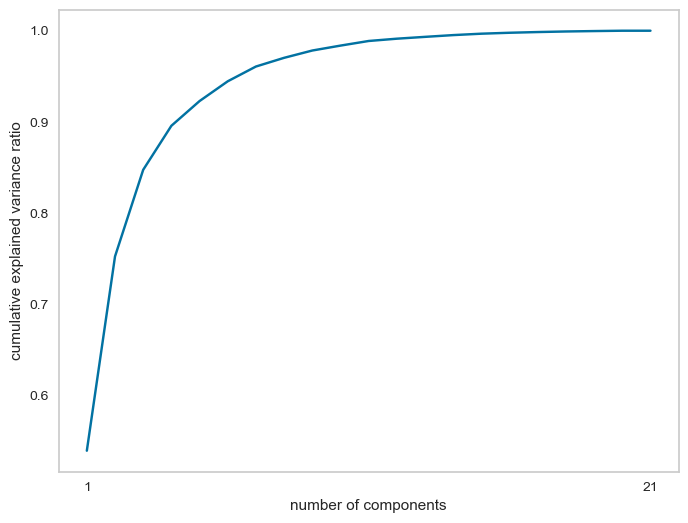

In [87]:
hour = 18
X = utility_mat  # utility_mats[hour]
n_components = 21


X = StandardScaler().fit_transform(X)

pca = PCA(n_components=n_components, whiten=True, random_state=0)
pca.fit(X)

plt.figure(figsize=(8, 6))
plt.plot(range(1, n_components+1), np.cumsum(pca.explained_variance_ratio_))
plt.xticks(range(1, n_components+1, 20))
plt.xlabel("number of components")
plt.ylabel("cumulative explained variance ratio")
plt.grid();
plt.show()


In [ ]:
n_components = 3
pca = PCA(n_components=n_components)

In [202]:
pd.set_option('precision', 2)

W = pca.components_
W_df = pd.DataFrame(W, columns=hour_mapper.keys(), index=[f'PC_{i}' for i in range(1,n_components+1)])
W_df.round(2).style.background_gradient(cmap='Blues')

,0,1,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
PC_1,0.22,0.18,-0.04,-0.26,-0.28,-0.28,-0.29,-0.28,-0.21,-0.09,-0.07,0.08,0.15,0.15,0.22,0.23,0.24,0.28,0.27,0.25,0.23
PC_2,0.04,0.14,0.05,-0.01,-0.06,-0.07,-0.02,0.12,0.29,0.41,0.43,0.42,0.37,0.31,0.15,-0.19,-0.21,-0.06,0.04,0.05,0.02
PC_3,0.42,0.30,0.08,0.19,0.14,0.14,0.14,0.10,-0.04,-0.12,0.04,0.03,-0.03,-0.25,-0.35,-0.28,-0.17,0.09,0.23,0.30,0.40


In [196]:
Z = pca.fit_transform(X)

Z_df = pd.DataFrame(Z, index=origin_mapper.keys(), columns=['Night', 'Noon', 'Morning'])[['Morning', 'Noon', 'Night']]
Z_df = Z_df.loc[['Zhongxiao_Fuxing', 'Taipei_City_Hall', 'Xinpu', 'Yongan_Market'], :]
Z_df.style.background_gradient(cmap='Blues', axis=1)

,Morning,Noon,Night
Zhongxiao_Fuxing,2.84,1.77,6.95
Taipei_City_Hall,1.38,-1.04,6.19
Xinpu,0.68,-0.22,-3.44
Yongan_Market,0.73,-0.32,-4.14


In [137]:
X_trans = Z @ W

kmeans = KMeans(n_clusters=3)
kmeans.fit(Z)
clust_labels = kmeans.labels_

# dbscan = DBSCAN(eps=1)
# dbscan.fit(Z)
# clust_labels = dbscan.labels_
###############
clust_df = pd.DataFrame(X_trans, index=origin_mapper.keys(), columns=hour_mapper.keys())
clust_df['labels'] = clust_labels

In [138]:
clust_df

,0,1,5,6,7,8,9,10,11,12,...,15,16,17,18,19,20,21,22,23,labels
Banxin,-0.15,-0.32,-0.04,0.22,0.31,0.33,0.24,-0.02,-0.39,-0.67,...,-0.74,-0.68,-0.47,0.14,0.18,-0.06,-0.22,-0.21,-0.12,0
Beimen,0.75,0.69,-0.03,-0.60,-0.72,-0.72,-0.69,-0.56,-0.28,0.08,...,0.68,0.55,0.56,0.32,0.36,0.70,0.81,0.80,0.75,1
Beitou,-0.57,-0.24,0.18,0.61,0.59,0.56,0.68,0.93,1.12,1.05,...,0.35,0.27,-0.20,-0.93,-1.00,-0.87,-0.65,-0.60,-0.64,0
Cailiao,-0.39,-0.46,0.15,1.02,1.10,1.10,1.06,0.85,0.34,-0.23,...,-0.87,-1.01,-1.17,-0.80,-0.71,-0.77,-0.72,-0.60,-0.42,0
Chiang_Kai-Shek_Memorial_Hall,-0.13,0.23,-0.17,-1.20,-1.25,-1.28,-1.16,-0.72,0.17,0.96,...,1.35,1.69,1.73,0.80,0.56,0.49,0.42,0.23,-0.12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zhongxiao_Fuxing,2.79,2.36,0.02,-1.28,-1.68,-1.66,-1.64,-1.43,-1.01,-0.25,...,1.59,0.85,0.81,0.46,0.80,2.12,2.59,2.71,2.78,2
Zhongxiao_Xinsheng,1.45,1.26,-0.11,-1.20,-1.40,-1.40,-1.39,-1.22,-0.79,-0.14,...,1.08,0.88,1.03,0.80,0.90,1.44,1.57,1.54,1.47,2
Zhongyi,-0.82,-0.55,-0.13,-0.36,-0.27,-0.28,-0.25,-0.12,0.19,0.39,...,0.17,0.60,0.72,0.46,0.24,-0.23,-0.45,-0.59,-0.80,1
Zhongyuan,-0.66,-1.03,-0.53,-1.00,-0.68,-0.62,-0.91,-1.53,-1.99,-2.10,...,-1.55,-0.71,0.51,2.25,2.10,0.78,-0.12,-0.40,-0.47,2


#### Viz

In [234]:
def visualizing_results(Z, label):
    """ Visualizing the clusters

    :param Z: PCA applied data
    :param label: K Means labels
    :param centroids_pca: PCA format K Means centroids
    """
    pca_df = pd.DataFrame(Z, columns=['PC1', 'PC2', 'PC3'], index=origin_mapper.keys()).reset_index()
    pca_df['label'] = label
    pca_df['label'] = pca_df['label'].astype(str)
    # fig = px.scatter(pca_df, 'PC1', 'PC3', 
    #                  color='label', 
    #                  hover_data={"origin": (pca_df['index'])},
    #                  labels={
    #                     "PC1": "Night",
    #                     "PC3": "Day",
    #                 },
    #                  width = 500, height = 500)

    fig = px.scatter_3d(pca_df, x='PC1', y='PC2', z='PC3', 
                     color='label', 
                     hover_data={"origin": (pca_df['index'])},
                     labels={
                        "PC1": "Night",
                        "PC2": "Noon",
                        "PC3": "Morning",
                    },
                     opacity=0.7,
                    size_max=1,
                     width = 700, height = 500
                     ).update_layout(margin=dict(l=0, r=0, b=0, t=0)
                    ).update_traces(marker_size = 5)
    
    fig.show()


# centroids = kmeans.cluster_centers_
# centroids_pca = pca.transform(centroids)

visualizing_results(Z, kmeans.labels_)


In [213]:
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = G.nodes[edge[0]]['pos']
    x1, y1 = G.nodes[edge[1]]['pos']
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

In [214]:
node_x = []
node_y = []
for node in G.nodes():
    x, y = G.nodes[node]['pos']
    node_x.append(x)
    node_y.append(y)

label_mapper = {k: l for k, l in zip(origin_mapper.keys(), kmeans.labels_)}

node_label = []
node_text = []
for node in G.nodes():
    if node in label_mapper.keys():
        node_label.append((label_mapper[node]))
        node_text.append(f'{node}, Cluster: {label_mapper[node]}')
    else:
        node_label.append(-1)
        node_text.append(f'{node}, No cluster data')

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text = node_text,
    marker=dict(
        showscale=False,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        colorscale='Picnic',
        reversescale=False,
        color=node_label,
        size=10,
        colorbar=dict(
            thickness=15,
            title='Cluster',
            xanchor='left',
            titleside='right'
        ),
        line_width=2)
        )

In [215]:
fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title=f'MRT stations clustering',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=True, zeroline=False, showticklabels=True),
                yaxis=dict(showgrid=True, zeroline=False, showticklabels=True)
                ),
                )
fig.show();

In [216]:
df_weekday = df[df['weekday'] == 1].groupby(['hour','origin'])['passenger_cnt'].agg('mean').reset_index()

# Comment this line to plot all stations
df_weekday['Cluster'] = df_weekday['origin'].apply(lambda x : label_mapper[x])

fig = px.line(df_weekday, x="hour", y="passenger_cnt", 
              color='Cluster', line_group="origin", facet_col="Cluster",
              title='Average Weekday Input of Each Station - By Cluster',
              labels={
                        "passenger_cnt": "Passengers Count",
                        "hour": "Hour",
                    },)
fig.show()

In [232]:
cluster1_plot = df_weekday[df_weekday['origin'].isin(['Taipei_Main_Station', 'Taipei_Zoo'])] 
fig = px.line(cluster1_plot, x="hour", y="passenger_cnt", 
              color='origin',
              title='Extreme Cases in Cluster 1 - Taipei Main Station v.s.  Taipei Zoo',
              labels={
                        "passenger_cnt": "Passengers Count",
                        "hour": "Hour",
                    },
                width=800
            )
fig.show()

### Task 6: LDA Topic Modeling